In [382]:
import random
import numpy as np
import math

In [383]:
class SimulatedAnnealing:
    def __init__(self,n_item,item_weights,item_values,capacity,initial_temprature,temprature_length,alpha) -> None:
        #First, Define our constant variables
        self.n_item = n_item
        self.item_weights = item_weights
        self.item_values = item_values
        self.capacity = capacity
        self.solution = [1 for i in range(self.n_item)]

        self.fitness = self.fitness_function(self.solution)
        self.temprature = initial_temprature
        self.temprature_length = temprature_length  #Iteration
        self.alpha = alpha
        
    def initial(self):
        while True:
            self.solution = [random.sample((0,1),1)[0] for j in range(self.n_item)]
            if self.feasible_function(self.solution):
                break
        self.fitness = self.fitness_function(self.solution)
        
    def feasible_function(self,solution):
        total_weights = 0
        for i in range(self.n_item):
            if solution[i]==1:
                total_weights += self.item_weights[i]
        return True if total_weights<=self.capacity else False 
    
    def fitness_function(self, solution):
        fitness_value = 0
        for i in range(self.n_item):
            if solution[i]==1:
                fitness_value += self.item_values[i%self.n_item]
        return fitness_value
    
    def cooling_temprature(self):
        self.temprature = self.alpha*self.temprature
        
    def get_neighbor(self,solution,method='negation'):
        neighbor = solution.copy()
        if method=='swap':
            neighbor = solution.copy()
            req_1,req_2 = random.sample(range(self.n_item),2)
            neighbor[req_1], neighbor[req_2] = neighbor[req_2], neighbor[req_1]
        elif method=='negation':
            zeros = []
            ones = []
            for i,value in enumerate(solution):
                if solution[i]==0:
                    zeros.append((i,0))
                else:
                    ones.append((i,1))
            neighbor_add = solution.copy()
            random_index = random.sample(zeros,1)[0][0]
            neighbor_add[random_index] = 1

            neighbor_put = solution.copy()
            random_index = random.sample(ones,1)[0][0]
            neighbor_put[random_index] = 0
            
            is_neighbor_add_feasible = self.feasible_function(neighbor_add)
            is_neighbor_put_feasible = self.feasible_function(neighbor_put)
            neighbor_add_fitness = self.fitness_function(neighbor_add)
            neighbor_put_fitness = self.fitness_function(neighbor_put)
            if is_neighbor_add_feasible and is_neighbor_put_feasible:
                neighbor = neighbor_add if neighbor_add_fitness > neighbor_put_fitness else neighbor_put
            elif is_neighbor_add_feasible == True and is_neighbor_put_feasible == False:
                neighbor = neighbor_add
            elif  is_neighbor_add_feasible == False and is_neighbor_put_feasible == True:
                neighbor = neighbor_put
            else:
                neighbor = neighbor_add if neighbor_add_fitness > neighbor_put_fitness else neighbor_put
        return neighbor

    def next_iteration(self):
        neighbor = self.get_neighbor(self.solution)
        cost_change = self.fitness_function(neighbor) - self.fitness_function(self.solution)
        if cost_change > 0:
            self.solution = neighbor
            self.fitness = self.fitness_function(self.solution)
        else:
            random_q = random.random()
            print(random_q,cost_change,self.temprature, math.exp(cost_change/self.temprature))
            if random_q < math.exp(cost_change/self.temprature):
                self.solution = neighbor
                self.fitness = self.fitness_function(self.solution)
                
    def run(self):
        for i in range(self.temprature_length):
            self.next_iteration()
            # print(self.fitness_function(self.solution))
            print(f'In temprature {self.temprature}th best fitness is:{self.fitness}')
            self.cooling_temprature()


In [384]:
def max_value_knapsack(model: SimulatedAnnealing, stop_point):
    MAX_INT = 10e12
    iteration_x = []
    iteration_y = []
    best_answer = [model.fitness,model.solution]
    temprature_counter = 0
    while (model.fitness < stop_point) and temprature_counter < model.temprature_length:
        iteration_x.append(temprature_counter)
        iteration_y.append(model.fitness)
        model.next_iteration()
        model.cooling_temprature()
        print(f'In ietration {temprature_counter}th and temprature{model.temprature} best fitness is:{model.fitness}')
        if model.fitness > best_answer[0]:
            best_answer[0] = model.fitness
            best_answer[1] = model.solution
        temprature_counter += 1

    print('----------------------------------------')
    print(f"\n{model.n_item}-required piece problem solved in temprature length of {temprature_counter}th . And best fitness(maximum number) is: { best_answer[0]} with pattern {best_answer[1]}")
    print('----------------------------------------')
    # print_stocks(stock_size=model.stock_size,pattern=best_answer[1],required_width=model.require_width)
    print('----------------------------------------')
    return (iteration_x, iteration_y, best_answer)


In [385]:
n_item = 20
weights = [92, 4, 43, 83, 84, 68, 92, 
82, 6, 44, 32, 18, 56, 83, 25, 96, 70, 48, 14, 58]
values = [44, 46, 90, 
72, 91, 40, 75, 35, 8, 54, 78, 40, 77, 15, 61, 17, 75, 29, 75, 63]
capacity = 878

In [386]:
model = SimulatedAnnealing(n_item=n_item,item_weights=weights,item_values=values,capacity=capacity,initial_temprature=50,temprature_length=100000,alpha=0.9999)
model.initial()
print(model.solution)
print(model.fitness)
x,y,best_ans = max_value_knapsack(model,stop_point=1000)
# print(model.get_neighbor([0,0,0,0]))

[0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]
514
In ietration 0th and temprature49.995 best fitness is:577
In ietration 1th and temprature49.9900005 best fitness is:652
In ietration 2th and temprature49.98500149995 best fitness is:730
In ietration 3th and temprature49.98000299980001 best fitness is:776
In ietration 4th and temprature49.97500499950003 best fitness is:820
0.3570253729612085 -40 49.97500499950003 0.4491492145626118
In ietration 5th and temprature49.97000749900008 best fitness is:780
In ietration 6th and temprature49.96501049825018 best fitness is:855
0.9417848650723025 -63 49.96501049825018 0.28340385393170475
In ietration 7th and temprature49.960013997200356 best fitness is:855
0.12624622210351844 -75 49.960013997200356 0.22286244415984624
In ietration 8th and temprature49.95501799580064 best fitness is:780
In ietration 9th and temprature49.95002249400106 best fitness is:855
0.7475601650150926 -90 49.95002249400106 0.1650014544295058
In ietration 10th and

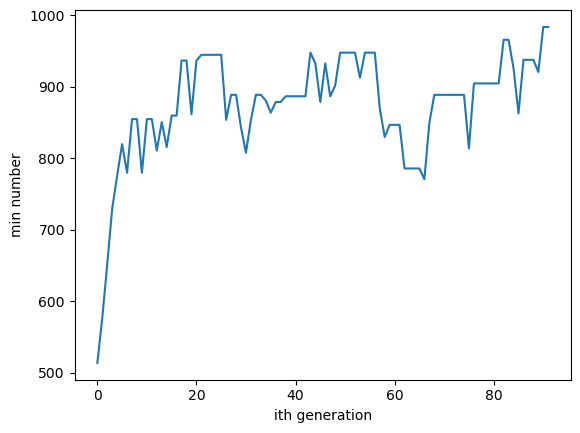

In [387]:
import matplotlib.pyplot as plt
plt.plot(x, y)
plt.xlabel("ith generation")
plt.ylabel("min number")

plt.show()

In [388]:
n_item = 50
weights = [80, 82, 85, 70, 72, 70, 
66, 50, 55, 25, 50, 55, 40, 48, 50, 32, 22, 60, 30, 32, 40, 38, 35, 
32, 25, 28, 30, 22, 50, 30, 45, 30, 60, 50, 20, 65, 20, 25, 30, 10, 
20, 25, 15, 10, 10, 10, 4, 4, 2, 1]
values = [220, 208, 198, 192, 180, 180, 165, 162, 160, 158, 155, 
130, 125, 122, 120, 118, 115, 110, 105, 101, 100, 100, 98, 96, 
95, 90, 88, 82, 80, 77, 75, 73, 72, 70, 69, 66, 65, 63, 60, 58, 56, 
50, 30, 20, 15, 10, 8, 5, 3, 1]
capacity = 1000

In [399]:
model = SimulatedAnnealing(n_item=n_item,item_weights=weights,item_values=values,capacity=capacity,initial_temprature=70,temprature_length=100000,alpha=0.9999)
model.initial()
print(model.solution)
print(model.fitness)
x,y,best_ans = max_value_knapsack(model,stop_point=3200)
# print(model.get_neighbor([0,0,0,0]))

[0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
1937
In ietration 0th and temprature69.993 best fitness is:2014
In ietration 1th and temprature69.98600069999999 best fitness is:2139
In ietration 2th and temprature69.97900209992999 best fitness is:2219
In ietration 3th and temprature69.97200419971999 best fitness is:2319
In ietration 4th and temprature69.96500699930002 best fitness is:2479
In ietration 5th and temprature69.95801049860009 best fitness is:2574
In ietration 6th and temprature69.95101469755024 best fitness is:2692
0.4317623807738886 -70 69.95101469755024 0.3676219127070206
In ietration 7th and temprature69.94401959608048 best fitness is:2692
0.5606695836540833 -80 69.94401959608048 0.31861498773268493
In ietration 8th and temprature69.93702519412088 best fitness is:2692
0.4185812544540747 -30 69.93702519412088 0.6511877110008771
In ietration 9th and temprature69.9300314916

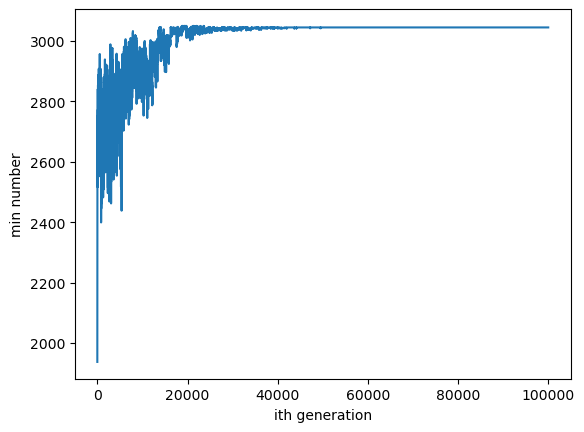

In [400]:
import matplotlib.pyplot as plt
plt.plot(x, y)
plt.xlabel("ith generation")
plt.ylabel("min number")

plt.show()